In [ ]:
!pip install opencv-python
!pip install pytesseract

In [ ]:
import cv2
import pytesseract
import os
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def image_read(image1, image2, title1="", title2=""):
    fig = plt.figure(figsize=(15, 15))
    ax1 = fig.add_subplot(121)
    ax1.imshow(image1, cmap="gray")
    ax1.set(xticks=[], yticks=[], title=title1)
    ax2 = fig.add_subplot(122)
    ax2.imshow(image2, cmap="gray")
    ax2.set(xticks=[], yticks=[], title=title2)

In [ ]:
results = []

License Plate Number for Cars44.png ==========> DL2CAGG786


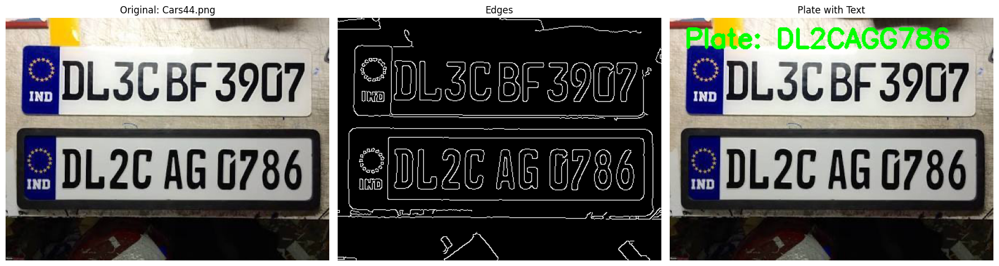

License Plate Number for Cars326.png ==========> DL8CX4850


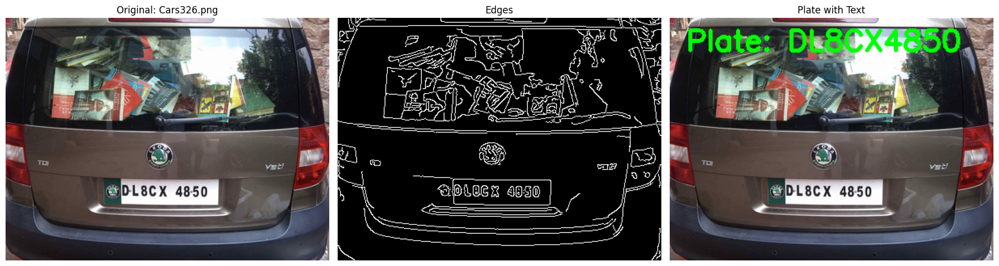

License Plate Number for Cars14.png ==========> ALR486


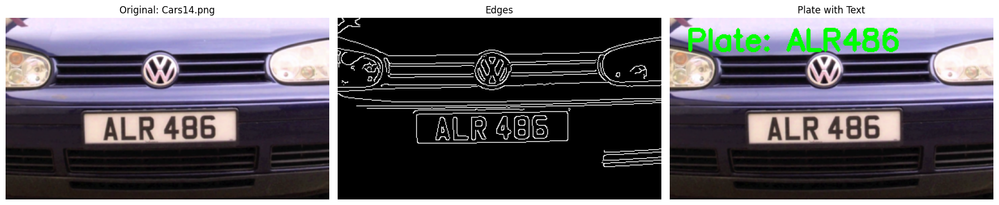

License Plate Number for Cars369.png ==========> 15LK10898


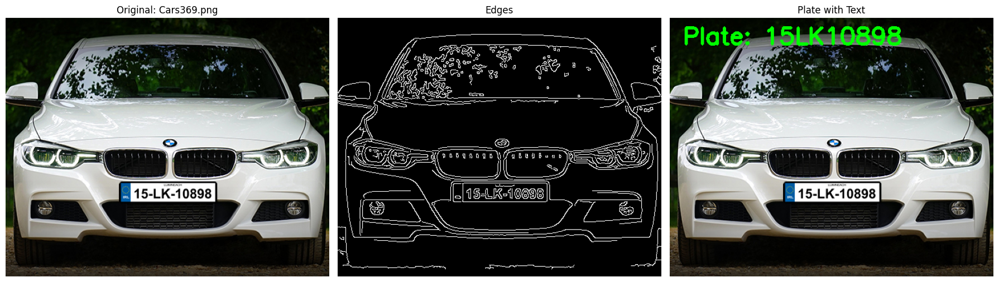

License Plate Number for Cars293.png ==========> GBIBTCE


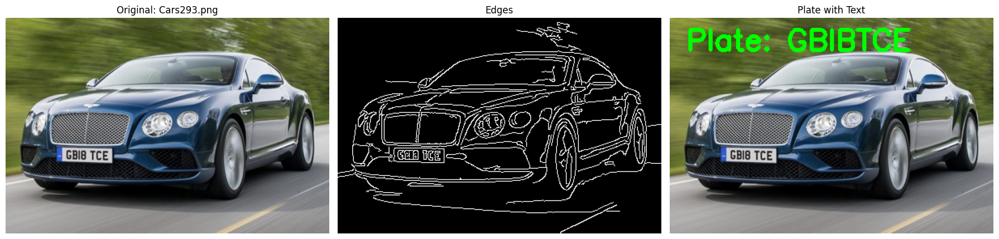

License Plate Number for Cars111.png ==========> MH20EE7598


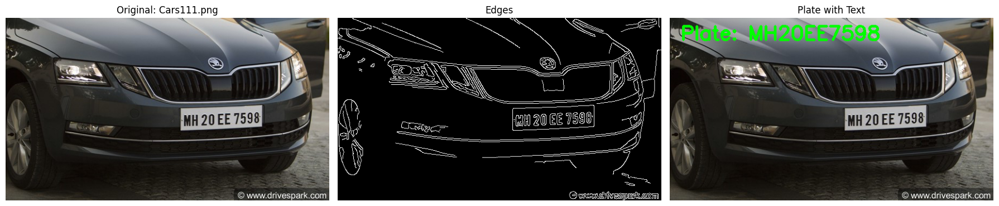

License Plate Number for Cars282.png ==========> 6861136


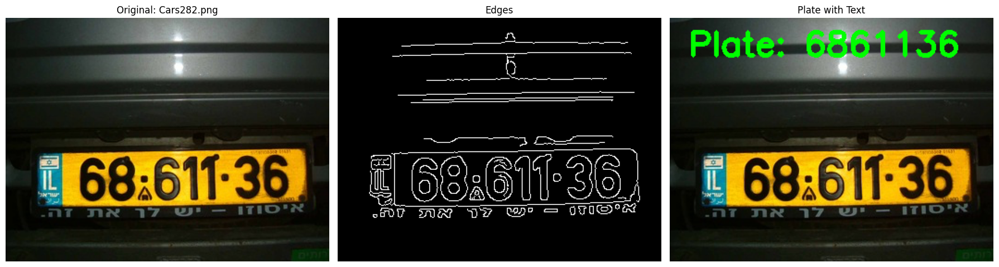

License Plate Number for Cars3.png ==========> DZI7YXR


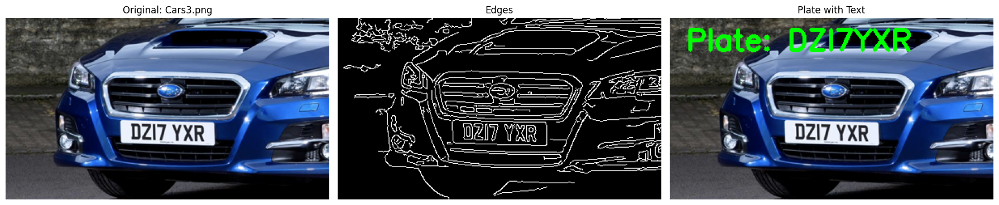

License Plate Number for Cars109.png ==========> CZI7KOD


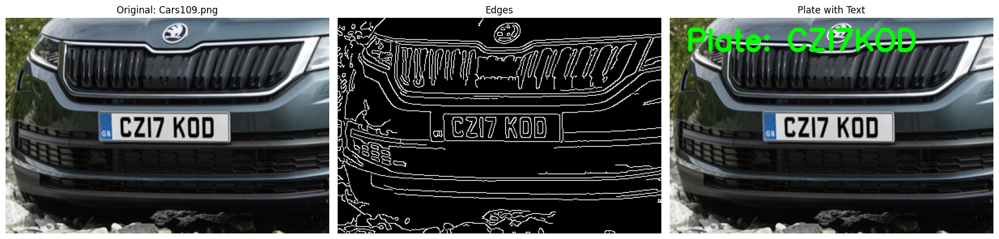

License Plate Number for Cars379.png ==========> M9239


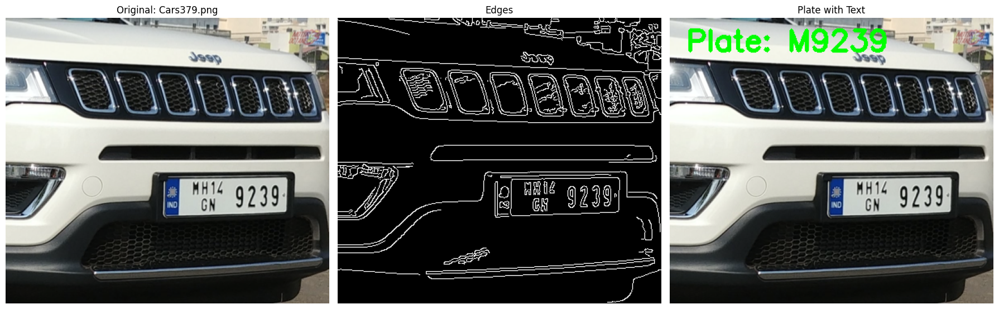

License Plate Number for Cars159.png ==========> DL7CN5617


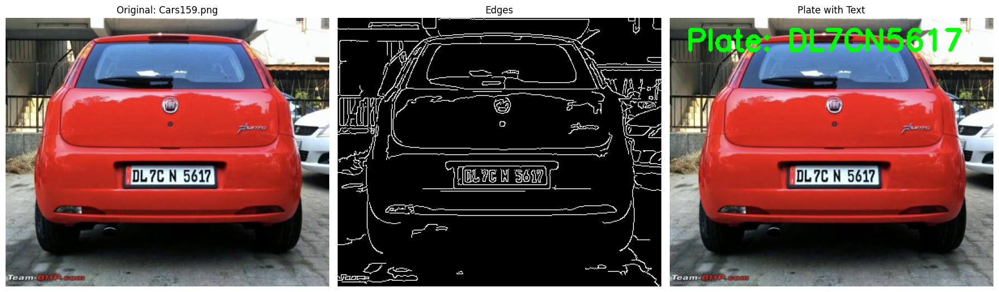

License Plate Number for Cars204.png ==========> NBYOND


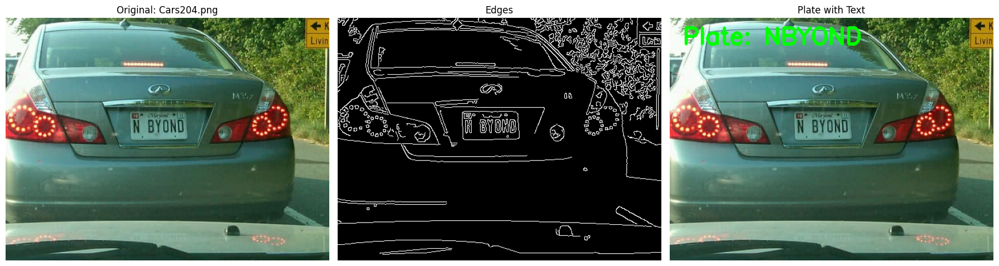

License Plate Number for Cars324.png ==========> 12LAF


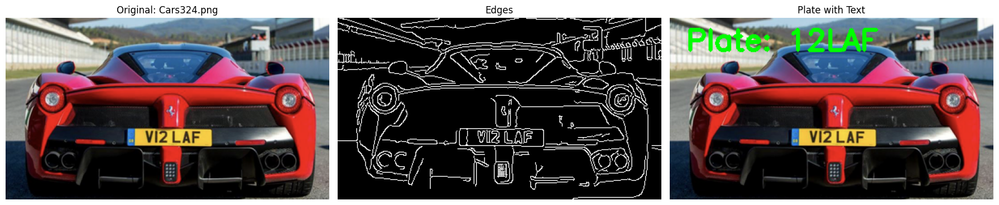

License Plate Number for Cars372.png ==========> HR26CE1485


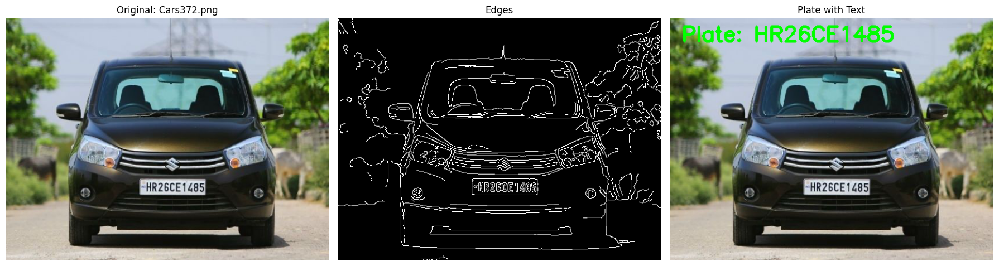

License Plate Number for Cars252.png ==========> DAN54P


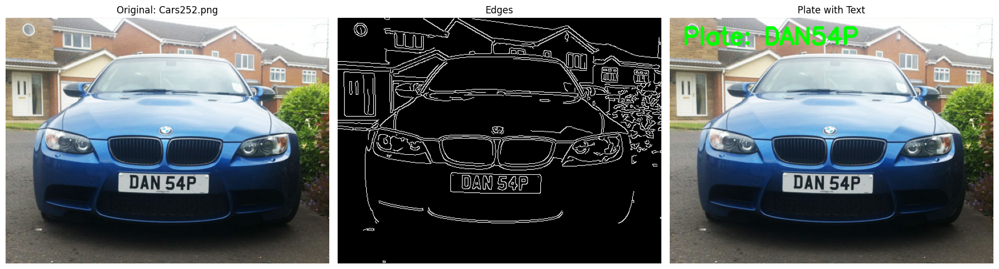

License Plate Number for Cars230.png ==========> LR33TEE


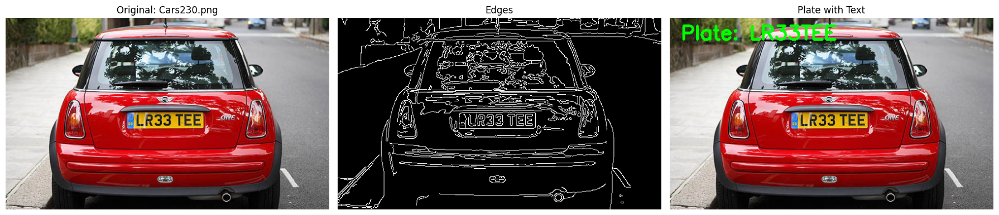

License Plate Number for Cars197.png ==========> LR33TEE


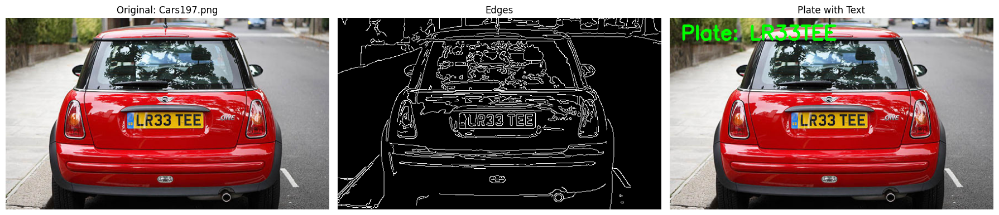

License Plate Number for Cars259.png ==========> MH20EE7598


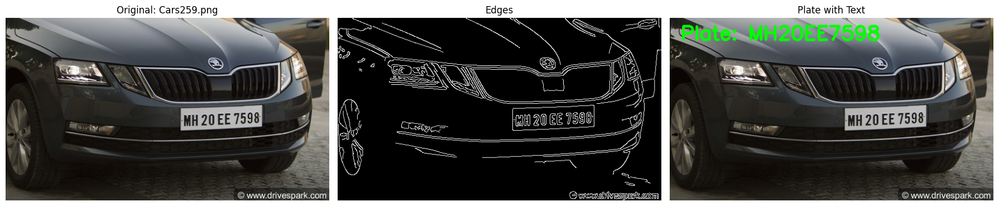

License Plate Number for Cars212.png ==========> KL65H 4383


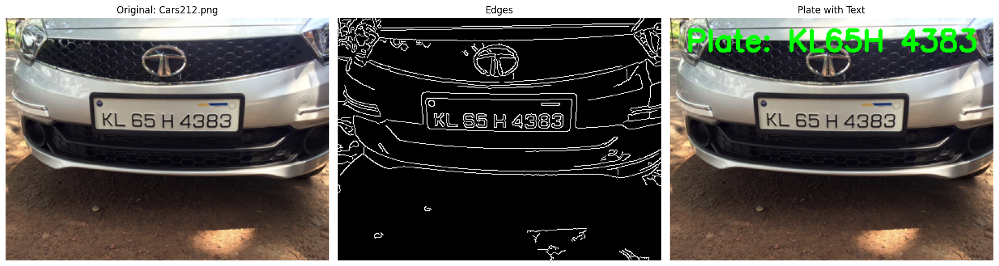

License Plate Number for Cars417.png ==========> BAD231


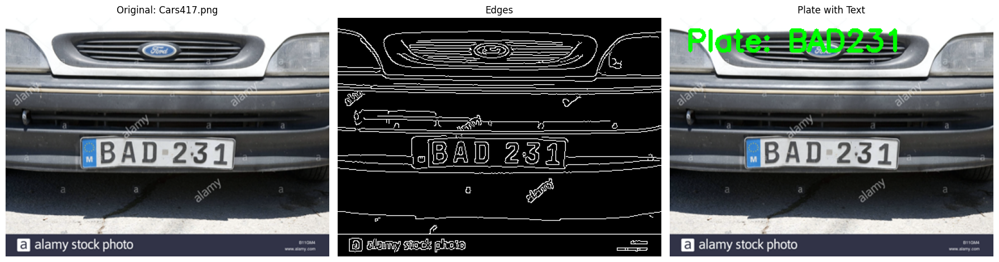

License Plate Number for Cars273.png ==========> BRIT0001


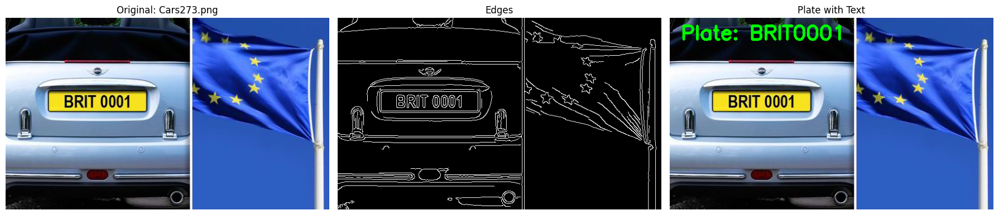

License Plate Number for Cars116.png ==========> MK3532


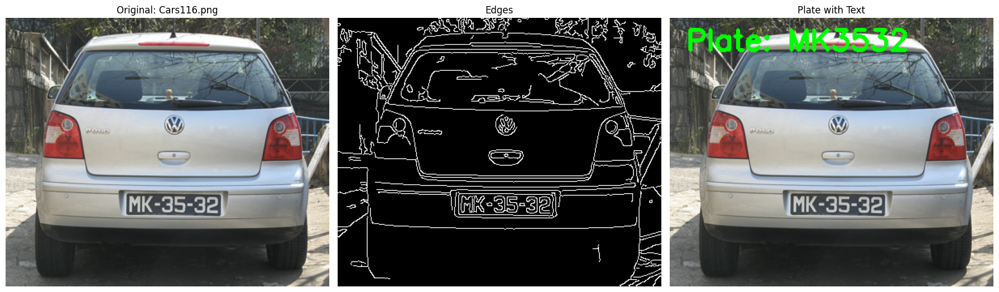

In [ ]:

for filename in os.listdir("dataset"):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
        path = os.path.join("dataset", filename)
        image = cv2.imread(path)
        if image is None:
            continue




        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)



        edges = cv2.Canny(gray, 50, 150)



        contours, _ = cv2.findContours(edges.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
        image_copy = image.copy()
        _ = cv2.drawContours(image_copy, contours, -1, (255, 0, 0), 2)

        contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]
        image_reduced = edges.copy()
        _ = cv2.drawContours(image_reduced, contours, -1, (255, 0, 0), 2)

        license_plate = None
        for contour in contours:
            perimeter = cv2.arcLength(contour, True)
            # 0.02 * perimeter: The precision parameter
            approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
            if len(approx) == 4:
                license_plate = approx
                break


        if license_plate is not None:
            mask = np.zeros(gray.shape, np.uint8)
            cv2.drawContours(mask, [license_plate], 0, 255, -1)
            plate_image = cv2.bitwise_and(image, image, mask=mask)


            plate_image_gray = cv2.cvtColor(plate_image, cv2.COLOR_BGR2GRAY)
            config = r'--oem 3 --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
            plate_number = pytesseract.image_to_string(plate_image_gray, config=config)
            print(f"License Plate Number for {filename} ==========> {plate_number.strip()}")


            fig, axs = plt.subplots(1, 3, figsize=(18, 6))


            axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            axs[0].set_title(f"Original: {filename}")
            axs[0].axis("off")

            axs[1].imshow(cv2.cvtColor(edges, cv2.COLOR_BGR2RGB))
            axs[1].set_title("Edges")
            axs[1].axis("off")


            annotated = image.copy()
            cv2.putText(annotated, f"Plate: {plate_number.strip()}", (20, 40),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)
            axs[2].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
            axs[2].set_title("Plate with Text")
            axs[2].axis("off")

            plt.tight_layout()
            plt.show()


            plate_path = f"plates/{os.path.splitext(filename)[0]}_plate.png"
            cv2.imwrite(plate_path, plate_image)

            results.append({
                "filename": filename,
                "plate_number": plate_number.strip(),
                "plate_image": plate_path
            })

        else:
            print(f"License plate not found in {filename}")
            results.append({
                "filename": filename,
                "plate_number": "Not found",
                "plate_image": "None"
            })

--oem 3	OCR Engine Mode: Use both Tesseract legacy and LSTM neural net (best for accuracy).
--psm 7	Page Segmentation Mode: Treat the image as a single line of text (ideal for license plates).
-c tessedit_char_whitelist=...	Restricts the recognition to only these characters (A–Z, 0–9).